In [1]:
from scipy import ndimage as ndi
from scipy.ndimage.filters import gaussian_filter
from scipy.ndimage import median_filter
from scipy.spatial import ConvexHull, convex_hull_plot_2d
import matplotlib.pyplot as plt
from skimage.feature import peak_local_max
from skimage import img_as_float
from PIL import Image
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
from shapely.affinity import scale

import laspy
from sklearn.cluster import DBSCAN
import numpy
import os
import cv2
import matplotlib.pyplot as plt
%matplotlib inline  
from tqdm import tqdm
import coord_f
import folium
import visualize
import db_settings
import geopandas
import pandas



Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
#ganz schlecht klassifiziet:3dm_32_330_5726_1_nw.las

las_files=["3dm_32_335_5725_1_nw.las", "3dm_32_331_5722_1_nw.las","3dm_32_338_5725_1_nw.las", "3dm_32_337_5727_1_nw.las", "3dm_32_337_5726_1_nw.las","3dm_32_337_5725_1_nw.las"]
folder = "lidar-files/4categorized/Wesel"
las_file = folder+ "/" + las_files[0]
las = laspy.read(las_file)
#setze größe der geplotteten bilder:
plt.rcParams['figure.figsize'] = [5, 5]



#setze größe der geplotteten bilder:
plt.rcParams['figure.figsize'] = [20, 20]

#43 Bäume laut kataster

In [3]:
las_points_x = numpy.array(las.points['x']) 
las_points_y = numpy.array(las.points['y'])
x_max, x_min, y_max, y_min = las_points_x.max(),  las_points_x.min(), las_points_y.max(),  las_points_y.min()
x_range = x_max - x_min
y_range = y_max - y_min
print(x_max, x_min,x_range, y_max, y_min, y_range)

336000.01 334999.98 1000.0300000000279 5726000.01 5724999.98 1000.0299999993294


0 Nie klassifiziert
1 Nicht zugewiesen
2 Oberfläche
3 Niedrige Vegetation
4 Mittelhohe Vegetation
5 Hohe Vegetation
6 Gebäude
7 Tiefpunkt
8 Reserviert
9 Wasser
10 Schienen
11 Straßenbelag
12 Reserviert
13 Schutzdraht (Schild)
14 Drahtleiter (Phase)
15 Strommast
16 Leitungsverbinder (Isolator)
17 Brückenfahrbahn
18 Hohes Rauschen

In [4]:
length = len(las.points['x'])
#points_to_cluster = numpy.zeros((length,3))
#points_to_cluster = numpy.array(list(map(lambda a, x,y,z,c : [x,y,z] if c == 5 else [None, None, None],tqdm(points_to_cluster), las.points['x'], las.points['y'], las.points['z'], las.points['classification'])))
#print(points_to_cluster)
classes_to_cluster = [5]
points_to_cluster = numpy.array([[las.points['x'][i], las.points['y'][i], las.points['z'][i]] for i in tqdm(range(length)) if (las.points['classification'][i] in classes_to_cluster)]) 
indices_of_cluster_points = numpy.array([i for i in tqdm(range(length)) if (las.points['classification'][i] in classes_to_cluster)]) 

#for i, l in tqdm(zip(indices_of_cluster_points, labels)):
#    if l == -1:
#        las.points['classification'][i] = 1 
#


100%|██████████| 8620784/8620784 [01:52<00:00, 76316.38it/s]


In [5]:

points_to_cluster2d = points_to_cluster[:,:2]
print(points_to_cluster2d)

[[ 335019.71 5725002.54]
 [ 335019.94 5725004.69]
 [ 335019.89 5725004.35]
 ...
 [ 335998.54 5725983.84]
 [ 335989.01 5725986.72]
 [ 335999.73 5725984.08]]


In [6]:
cluster = DBSCAN(eps=0.6, min_samples=5).fit(points_to_cluster2d)  # parameters according to https://www.degruyter.com/document/doi/10.1515/geo-2020-0266/html?lang=de
labels = cluster.labels_

In [8]:
print(labels)
colors = visualize.label_to_color_map(labels)
colors2 = visualize.merge_class_with_labels(points_to_cluster, labels, indices_of_cluster_points, las.points['classification'])



[   0    0    0 ... 8116   -1 8116]


100%|██████████| 8120/8120 [00:00<00:00, 346249.04it/s]


label_colors (8120, 3)


100%|██████████| 2132532/2132532 [00:04<00:00, 446916.63it/s]


colorize points by classification-number:


100%|██████████| 8620784/8620784 [01:56<00:00, 73979.40it/s]


painting clusters:


100%|██████████| 2132532/2132532 [00:01<00:00, 1350394.65it/s]


In [9]:
visualize.draw_point_cloud(points_to_cluster, colors)

visualize.draw_point_cloud(numpy.array([las.points['x'],las.points['y'],las.points['z']]).transpose(), colors2)

In [7]:
cluster_dict = {}
for i in range(max(labels) +1):
    if i >= 0:
        cluster_dict[i] = []
for i, p in tqdm(zip(labels, points_to_cluster)):
    #drop not clustered points with label -1:
    if i >= 0:
        cluster_dict[i] =  cluster_dict[i] + [p]


2194137it [02:47, 13076.15it/s] 


In [8]:
lat,long = coord_f.utm_to_lat_long(x_max, y_max)
lat_min,long_min = coord_f.utm_to_lat_long(x_min, y_min)

f_map = folium.Map(location=[lat, long], zoom_start=14)
#add las area:
folium.Marker(location=[lat, long],icon=folium.Icon(color="red")).add_to( f_map )
folium.Marker(location=[lat_min, long_min],icon=folium.Icon(color="red")).add_to( f_map )
folium.Marker(location=[lat, long_min],icon=folium.Icon(color="red")).add_to( f_map )
folium.Marker(location=[lat_min, long],icon=folium.Icon(color="red")).add_to( f_map )




for values in cluster_dict.values():
    center = numpy.array(values).mean(axis=0)
    lat, long = coord_f.utm_to_lat_long(center[0], center[1])
    folium.Marker(location=[lat, long],icon=folium.Icon(color="green")).add_to( f_map )
    
#for lat, long in latlong_coordinates:
#    folium.Marker(location=[lat, long],icon=folium.Icon(color="green")).add_to( f_map )

f_map

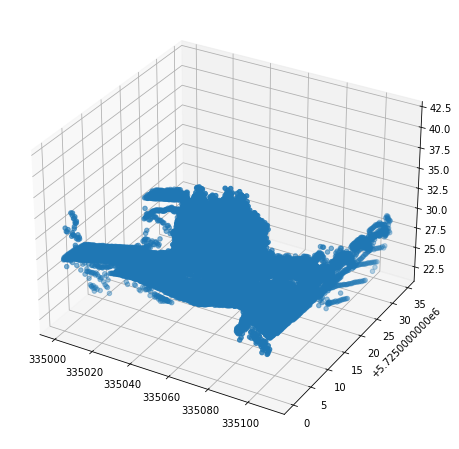

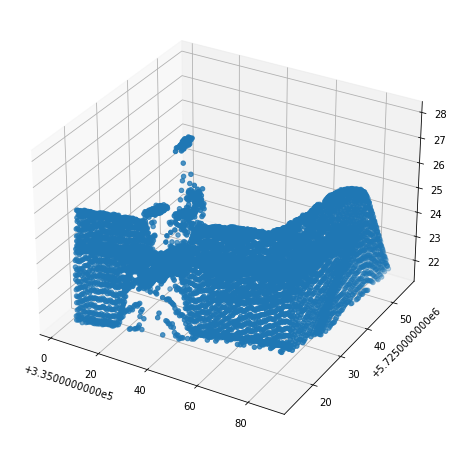

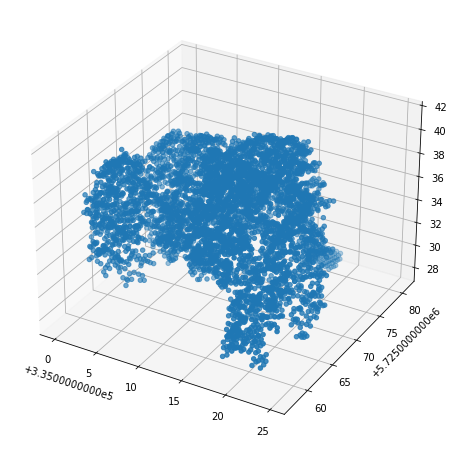

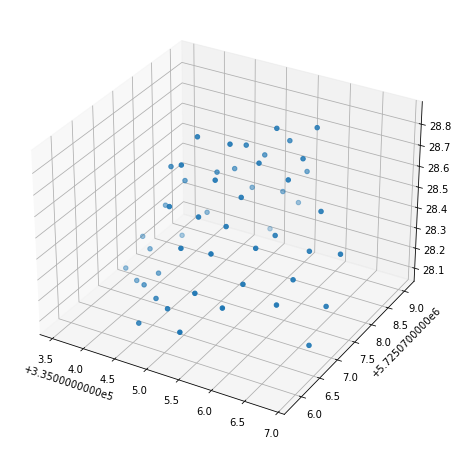

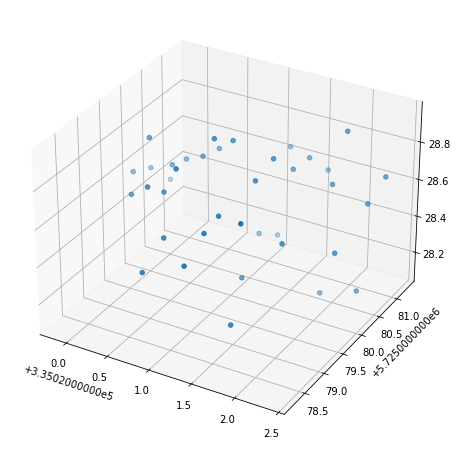

...

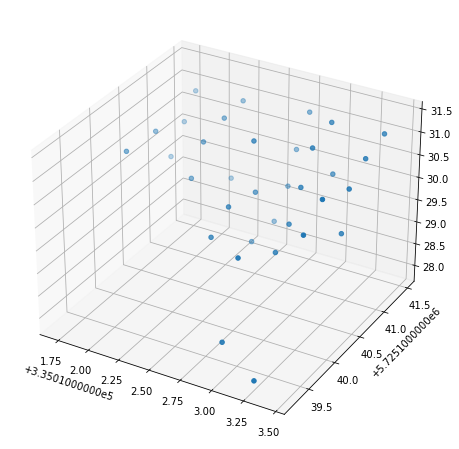

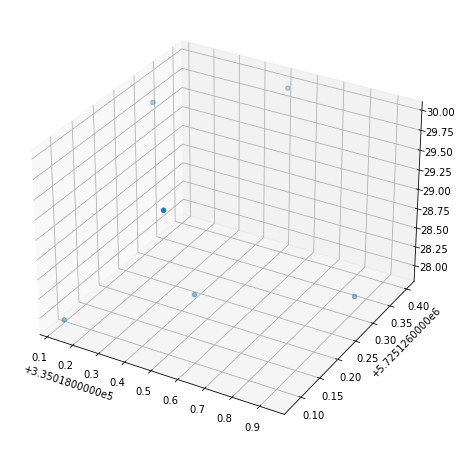

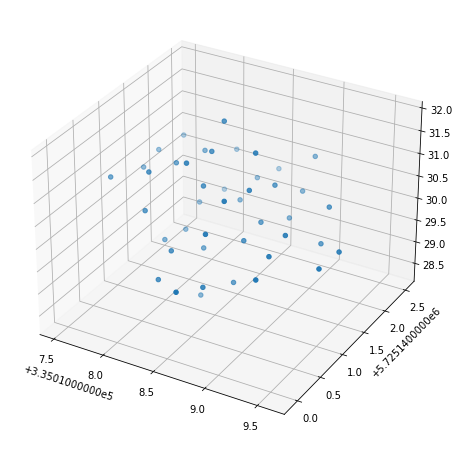

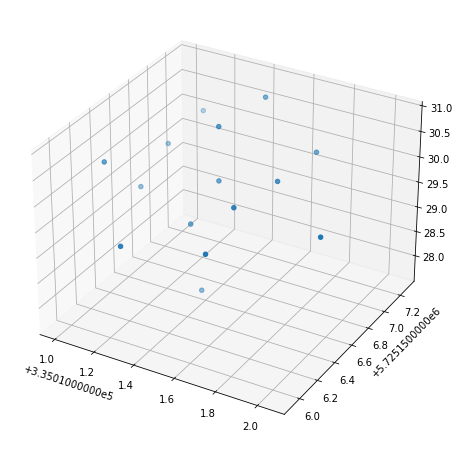

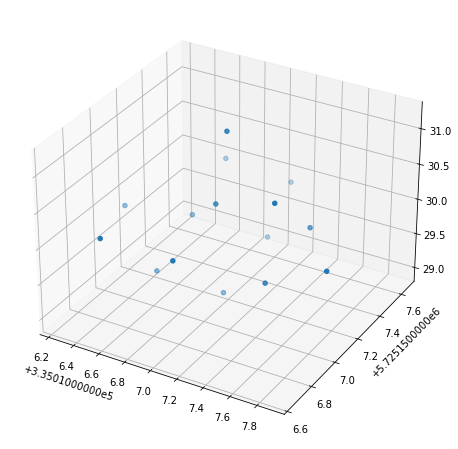

In [9]:
# plot first 20 cluster:

for i in range(20):
    points = cluster_dict[i]
    #MultiPoint(points)
    x = [point[0] for point in points]
    y = [point[1] for point in points]
    z = [point[2] for point in points]

    #plt.scatter(xs, ys)
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(x, y, z)
    plt.show()

In [10]:
#x/y-convex hull
hull_dict = {}
for key in cluster_dict.keys():
    tree = numpy.array(cluster_dict[key]).transpose((1, 0))
    x = tree[0]
    y = tree[1]    
    points_2d = numpy.array([x,y]).transpose()
    
    if len(points_2d) > 50:
        hull = ConvexHull(points_2d)
        poly = Polygon(points_2d[hull.vertices])
        poly = scale(poly, xfact=1.1,yfact=1.1)
        hull_dict[key] = poly
        """

        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 3))

        for ax in (ax1, ax2):
            ax.plot(points_2d[:, 0], points_2d[:, 1], '.', color='k')
            if ax == ax1:
                ax.set_title('Given points')
            else:
                ax.set_title('Convex hull')
                for simplex in hull.simplices:
                    ax.plot(points_2d[simplex, 0], points_2d[simplex, 1], 'c')
                ax.plot(points_2d[hull.vertices, 0], points_2d[hull.vertices, 1], 'o', mec='r', color='none', lw=1, markersize=10)
        plt.show()
        """        

    

In [11]:
#db lockup baumkataster
db =db_settings.db(autocommit=False)

db_file_name = las_file.split('/')[-1].split('.')[0]
#db_file_name = db_file_name[8:]
print(db_file_name)
req = """SELECT ID FROM lidar_proj.LIDAR_FILES WHERE FILE_NAME = \'"""+db_file_name+"""\'"""
lidar_file_number = db.export_to_pandas(req)

trees =db.export_to_pandas("""SELECT * FROM lidar_proj.trees WHERE city_ID=""" + str(3) +"""and LIDAR_FILE_ID="""+str(lidar_file_number['ID'].values[0])+"""ORDER BY id""")
print(trees)

print(lidar_file_number)


3dm_32_335_5725_1_nw
         ID              X             Y  CITY_ID  ID_GATTUNG  LIDAR_FILE_ID
0         1  335523.956445  5.725867e+06        3          81            111
1         2  335532.990900  5.725864e+06        3          81            111
2         3  335535.470698  5.725857e+06        3          81            111
3         5  335555.629525  5.726000e+06        3         116            111
4         6  335546.366808  5.725998e+06        3         116            111
...     ...            ...           ...      ...         ...            ...
1401  13666  335890.325407  5.725944e+06        3           2            111
1402  13669  335804.337384  5.725333e+06        3           2            111
1403  13724  335962.658837  5.725545e+06        3          73            111
1404  13725  335973.534752  5.725575e+06        3          73            111
1405  13755  335953.548662  5.725100e+06        3           2            111

[1406 rows x 6 columns]
    ID
0  111


In [51]:
# x und y zusammenfassen!
#dann:
trees['coords'] = numpy.array(zip(trees['X'],trees['Y']))
trees['coords'] = trees['coords'].apply(Point)
trees_df = geopandas.GeoDataFrame(trees, geometry='coords', crs="EPSG:25832")
print(trees)


         ID              X             Y  CITY_ID  ID_GATTUNG  LIDAR_FILE_ID  \
0         1  335523.956445  5.725867e+06        3          81            111   
1         2  335532.990900  5.725864e+06        3          81            111   
2         3  335535.470698  5.725857e+06        3          81            111   
3         5  335555.629525  5.726000e+06        3         116            111   
4         6  335546.366808  5.725998e+06        3         116            111   
...     ...            ...           ...      ...         ...            ...   
1401  13666  335890.325407  5.725944e+06        3           2            111   
1402  13669  335804.337384  5.725333e+06        3           2            111   
1403  13724  335962.658837  5.725545e+06        3          73            111   
1404  13725  335973.534752  5.725575e+06        3          73            111   
1405  13755  335953.548662  5.725100e+06        3           2            111   

                              coords  


In [52]:
hulls_df = pandas.DataFrame({'HULL_DICT_KEY': hull_dict.keys(), 'coords': hull_dict.values()})
hulls_df = geopandas.GeoDataFrame(hulls_df, geometry='coords', crs="EPSG:25832")
print(hulls_df)

      HULL_DICT_KEY                                             coords
0                 0  POLYGON ((335059.654 5724998.261, 335091.720 5...
1                 1  POLYGON ((335090.743 5725057.275, 335089.852 5...
2                 2  POLYGON ((335019.639 5725081.445, 335019.331 5...
3                 3  POLYGON ((335007.016 5725077.486, 335005.366 5...
4                 5  POLYGON ((334999.364 5725091.436, 334999.618 5...
...             ...                                                ...
2345           8096  POLYGON ((335887.275 5726000.837, 335883.700 5...
2346           8102  POLYGON ((335887.688 5726000.126, 335888.888 5...
2347           8107  POLYGON ((335903.346 5725975.929, 335904.579 5...
2348           8109  POLYGON ((335905.807 5725995.010, 335906.534 5...
2349           8114  POLYGON ((335956.316 5725985.446, 335955.524 5...

[2350 rows x 2 columns]


<AxesSubplot:>

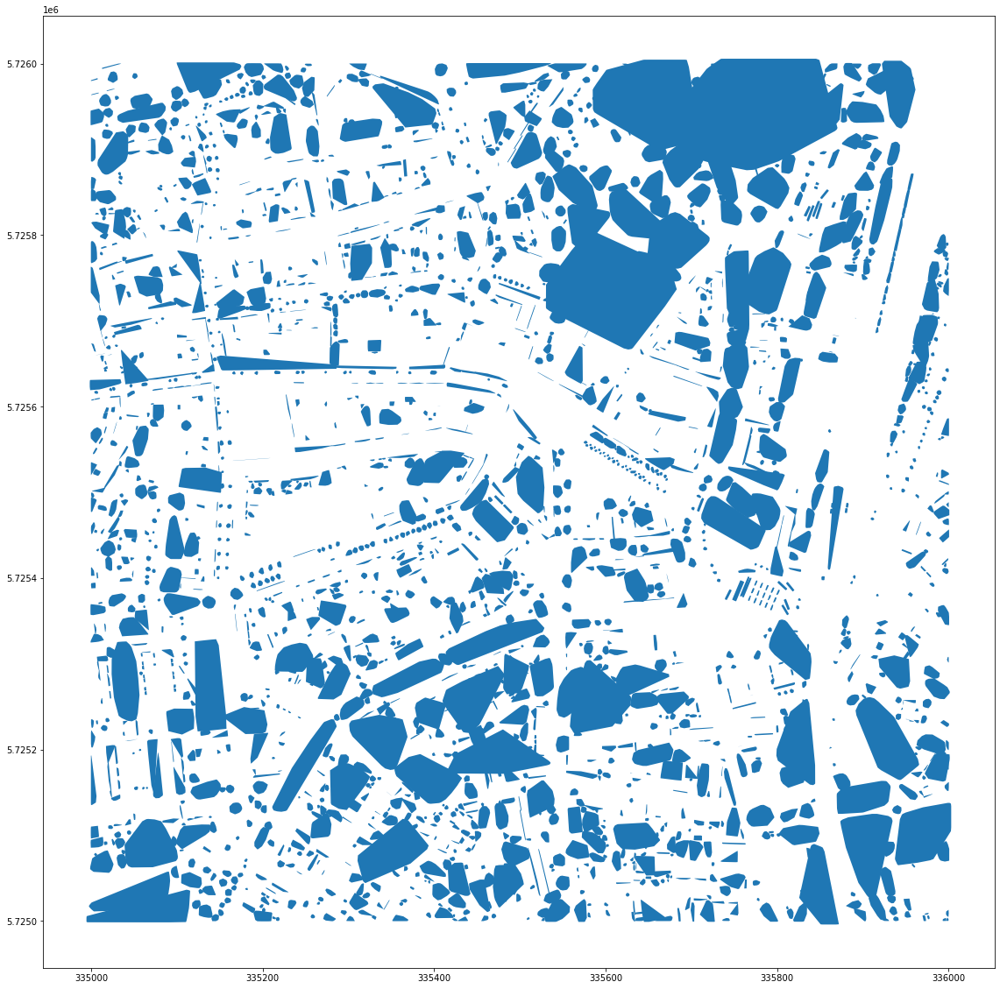

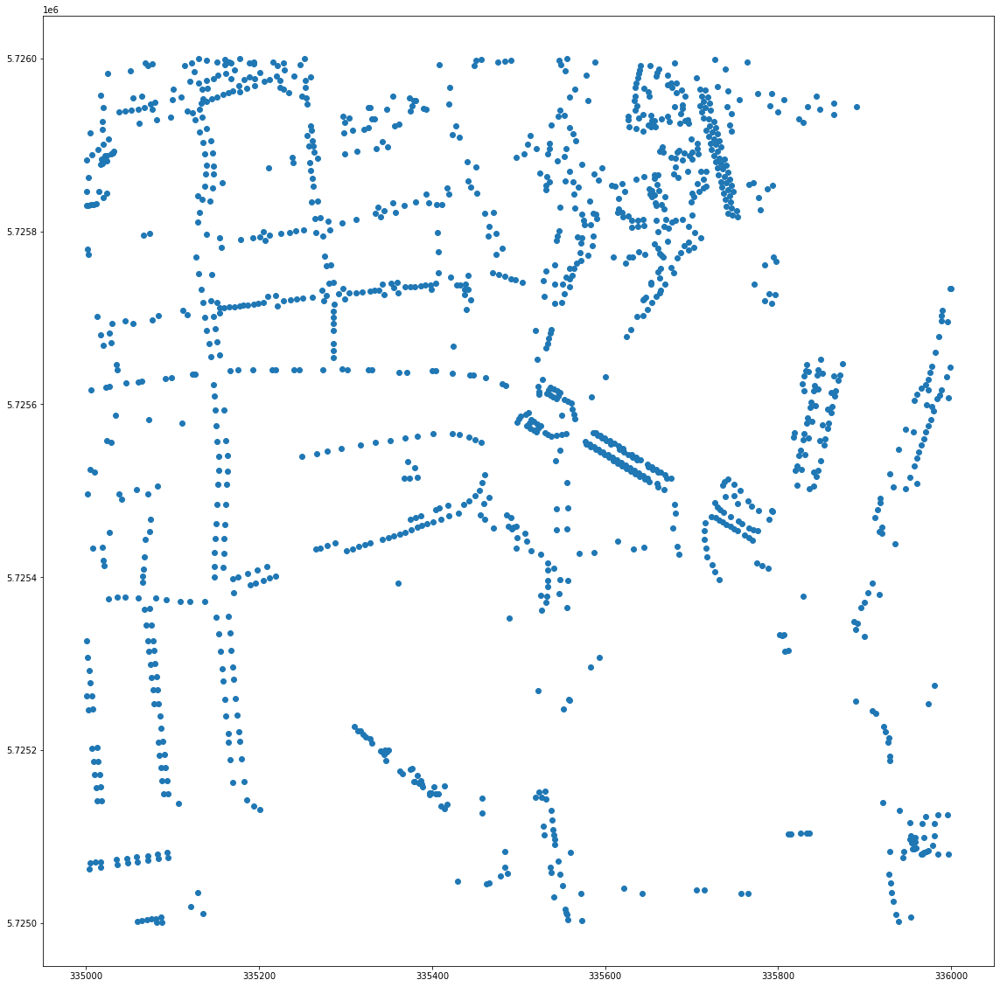

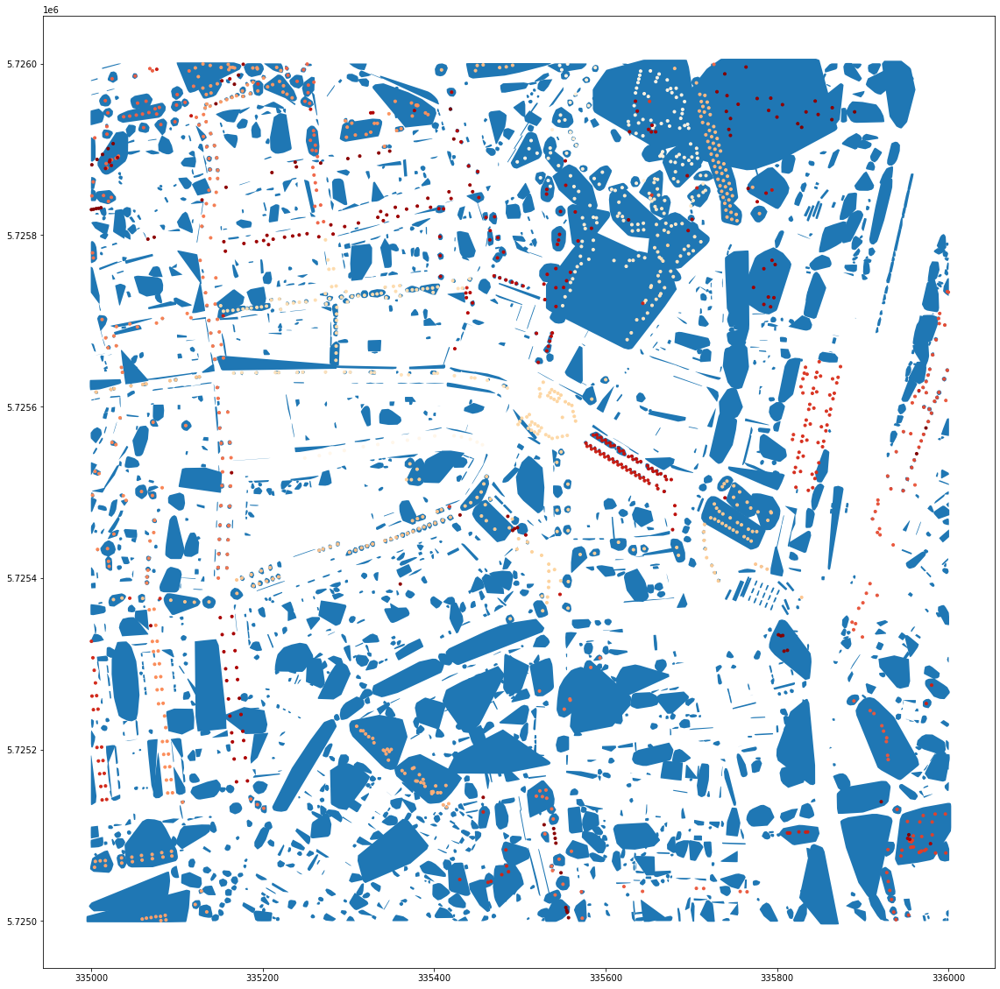

In [53]:
hulls_df.plot()
trees_df.plot()
ax = hulls_df.plot()
trees_df.plot(ax=ax,cmap='OrRd', marker='.')

,ID,X,Y,CITY_ID,ID_GATTUNG,LIDAR_FILE_ID,coords,index_right,HULL_DICT_KEY
0,1,335523.956445,5.725867e+06,3,81,111,POINT (335523.956 5725866.986),2232,7724
1,2,335532.990900,5.725864e+06,3,81,111,POINT (335532.991 5725863.798),2228,7717
2,3,335535.470698,5.725857e+06,3,81,111,POINT (335535.471 5725857.038),2228,7717
1234,12387,335531.089877,5.725848e+06,3,81,111,POINT (335531.090 5725847.942),2228,7717
1235,12388,335531.405651,5.725853e+06,3,81,111,POINT (335531.406 5725853.386),2228,7717
...,...,...,...,...,...,...,...,...,...
1402,13669,335804.337384,5.725333e+06,3,2,111,POINT (335804.337 5725332.580),976,3347
1398,13583,335171.817993,5.725987e+06,3,69,111,POINT (335171.818 5725986.776),1732,5793
1400,13585,335418.915669,5.725947e+06,3,16,111,POINT (335418.916 5725947.103),1841,6342
1401,13666,335890.325407,5.725944e+06,3,2,111,POINT (335890.325 5725943.893),2335,8041


<AxesSubplot:>

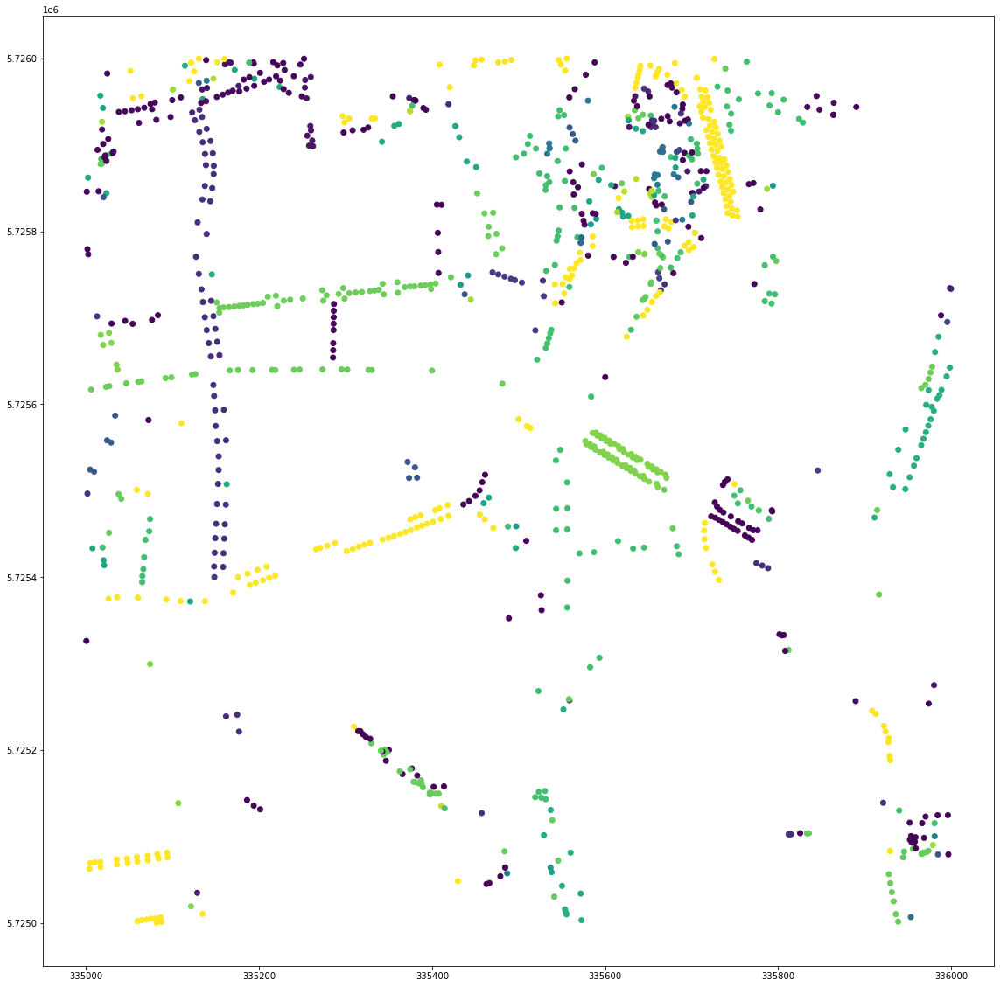

In [54]:
# map to kataster
intersections = geopandas.tools.sjoin(trees_df,hulls_df, op="intersects", how='inner') #intersects
#intersections2 = geopandas.tools.sjoin(hulls_df, trees_df, op="intersects", how='inner')  # nur zum plotten!

display(intersections)
intersections.plot(c=intersections.ID_GATTUNG)

#ax = intersections2.plot()
#intersections.plot(ax=ax,c=intersections.GATTUNG)


In [55]:
#print all clusters with kataster-match:

for i, row in intersections.iterrows():

        #hull = hull_dict[row.index_right]        
        points = cluster_dict[row.HULL_DICT_KEY]
        x = [point[0] for point in points]
        y = [point[1] for point in points]
        z = [point[2] for point in points]

        #plt.scatter(xs, ys)
        #fig = plt.figure(figsize=(8, 8))
        #ax = fig.add_subplot(111, projection='3d')
        #ax.scatter(x, y, z)
        #plt.show()
        


In [56]:
print(len(intersections))
dropped= 0
intersections2 = intersections
visited = []
for i, row in intersections.iterrows():
        cluster_key= row.index_right
        doubles = intersections.loc[intersections.index_right==cluster_key,:] 
        if (len(doubles) > 1):
            genus = []
            for i, row in doubles.iterrows():            
                genus.append(row.ID_GATTUNG)
            #Prüfe: gibt es mehr als eine Gattungs-Zuordnung für diesen Cluster?
            #print(genus)
            genus = set(genus)
            #print(genus)
            if (len(genus) > 1):                
                if (row['index_right'] not in visited):
                    dropped += len(doubles)
                    visited.append(row['index_right'])

                #wenn ja, schmeisse ihn raus:
  

                intersections2 = intersections2.drop(intersections2[intersections2.index_right   == cluster_key].index)

            elif(row['index_right'] not in visited): 
                intersections2 = intersections2.drop(intersections2[((intersections2.index_right == cluster_key) & (intersections2.ID != row['ID'])) ].index)
                visited.append(row['index_right'])
                dropped += len(doubles) - 1
                
print(len(intersections2))
                
print(dropped, " clusters dropped beacause of multiple matches")


    

1080
452
616  clusters dropped beacause of multiple matches


In [70]:
display(intersections2)
#ID: ID DES BAUMES
row = intersections2.loc[intersections2['HULL_DICT_KEY'] == 7906]  
#print(row)
print(int(row.ID))

,ID,X,Y,CITY_ID,ID_GATTUNG,LIDAR_FILE_ID,coords,index_right,HULL_DICT_KEY
0,1,335523.956445,5.725867e+06,3,81,111,POINT (335523.956 5725866.986),2232,7724
1235,12388,335531.405651,5.725853e+06,3,81,111,POINT (335531.406 5725853.386),2228,7717
5,7,335548.758934,5.725993e+06,3,116,111,POINT (335548.759 5725992.963),2295,7906
21,30,335553.862927,5.725986e+06,3,116,111,POINT (335553.863 5725986.007),2299,7917
26,35,335520.046352,5.725896e+06,3,81,111,POINT (335520.046 5725895.721),1823,6259
...,...,...,...,...,...,...,...,...,...
1381,13305,335554.556132,5.725012e+06,3,73,111,POINT (335554.556 5725012.225),680,2313
1398,13583,335171.817993,5.725987e+06,3,69,111,POINT (335171.818 5725986.776),1732,5793
1400,13585,335418.915669,5.725947e+06,3,16,111,POINT (335418.916 5725947.103),1841,6342
1401,13666,335890.325407,5.725944e+06,3,2,111,POINT (335890.325 5725943.893),2335,8041


7


In [60]:
#scale 0:1
normalized_trees = {}
for i, row in intersections2.iterrows():
    points = numpy.array(cluster_dict[row.HULL_DICT_KEY])
    points = points/ numpy.max(points)
    x = [point[0] for point in points]
    y = [point[1] for point in points]
    z = [point[2] for point in points]

    #plt.scatter(xs, ys)
    #fig = plt.figure(figsize=(8, 8))
    #ax = fig.add_subplot(111, projection='3d')
    #ax.scatter(x, y, z)
    #plt.show()
    normalized_trees[row.HULL_DICT_KEY] = points

    

    


In [28]:
#save
#dabei die z koordiante nicht vergessen, die muss ganz oben aus dem cluster_dict geholt werden!
import create_new_las
for key in normalized_trees.keys():
    print(key)
    x, y, z = normalized_trees[key].transpose()
    print(x)


    c_las = create_new_las.build_las(x, y, z)
    visualize.plot_las_3d(c_las, 'classification')
    
    break

7724
[0.05859774 0.05859766 0.05859781 ... 0.05859877 0.05859846 0.05859871]
<LasHeader(1.4, <PointFormat(8, 0 bytes of extra dims)>)>
colr_ap [5 5 5 ... 5 5 5]
alt_ap [[0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5]]
[[1. 1. 1.]
 [1. 1. 1.]
 [1. 1. 1.]
 ...
 [1. 1. 1.]
 [1. 1. 1.]
 [1. 1. 1.]]


In [61]:
print(c_las.points['z'])

<ScaledArrayView([0 0 0 ... 0 0 0])>


In [62]:
c = None
r, g, b, nir = [None, None, None, None]
save_path = None
file_name = None
header = laspy.LasHeader(point_format=8, version="1.4")
header.offsets = numpy.array([0, 0, 0])
header.scales = numpy.array([0.000000001, 0.000000001, 0.000000001])

las = laspy.LasData(header)

las = laspy.convert(las, point_format_id=8)
print(las.header)
las.x = x
las.y = y
las.z =z
if c is not None:
    las.points['classification'] = c
else:
    #set all to high classification
     las.points['classification'] = numpy.ones(len(x)) * 5
if r is not None and g is not None and b is not None:
    las.red = r
    las.green = g
    las.blue = b
if nir is not None:
    las.nir = nir

if save_path is not None:
    if not os.path.exists(save_path):
            os.mkdir(save_path)
    save_path = os.path.join(save_path,file_name)
    print("save to ", save_path)
    las.write(save_path)
print(las.x)
import open3d as o3d

point_data = numpy.stack([las.x, las.y,las.z], axis=0).transpose((1, 0))
geom = o3d.geometry.PointCloud()
geom.points = o3d.utility.Vector3dVector(point_data)
o3d.visualization.draw_geometries([geom])




<LasHeader(1.4, <PointFormat(8, 0 bytes of extra dims)>)>
<ScaledArrayView([0.05867957 0.0586796  0.05867958 0.0586796  0.05867962 0.05867958
 0.05867951 0.05867949 0.05867953 0.05867955 0.05867953 0.05867955
 0.05867946 0.05867945 0.05867948 0.05867944 0.05867947 0.05867951
 0.05867947 0.05867949 0.05867945 0.05867947 0.05867943 0.0586795
 0.05867938 0.05867936 0.0586794  0.05867939 0.05867941 0.05867938
 0.05867941 0.0586794  0.05867942 0.05867929 0.05867933 0.05867934
 0.05867932 0.0586793  0.05867939 0.05867933 0.05867927 0.05867929
 0.05867929 0.05867921 0.05867925 0.05867926 0.05867927 0.05867923
 0.05867915 0.05867916 0.05867918 0.05867919 0.05867919])>
